In [39]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=20)

In [40]:
import pandas as pd

df = pd.DataFrame(X, columns = ["feature1", "freature2"])
df["target"] = y

In [41]:
import matplotlib.pyplot as plt

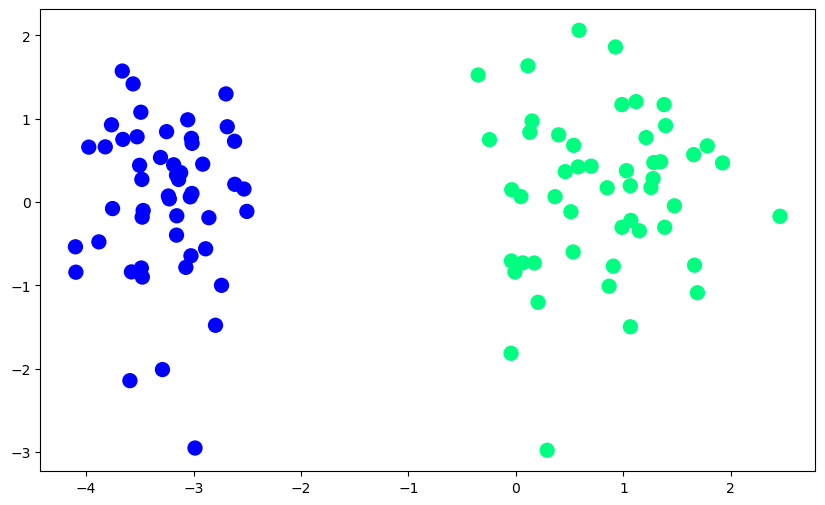

In [42]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

In [43]:
def perceptron(X,y):
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
    return weights[0],weights[1:]
        

In [44]:
def step(z):
    return 1 if z>0 else 0

In [45]:
intercept_,coef_ = perceptron(X,y)

In [46]:
print(coef_)
print(intercept_)

[1.0580085  0.40381514]
1.2000000000000002


In [47]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [48]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

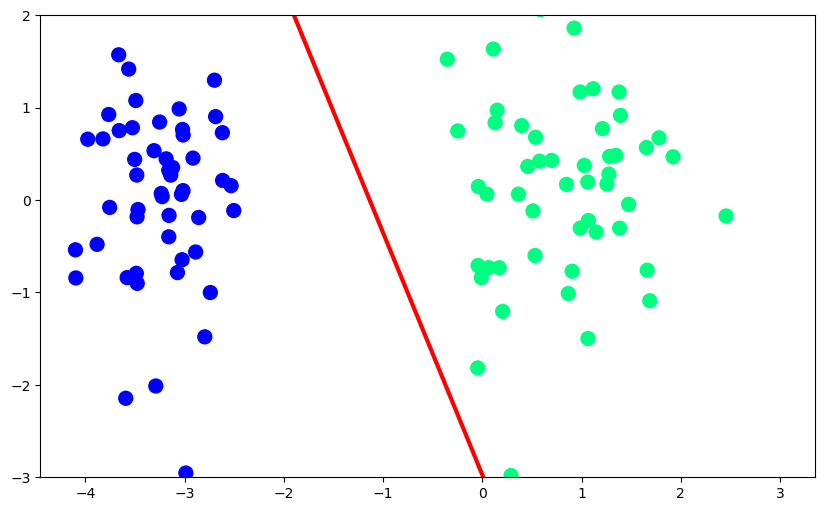

In [49]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [50]:
def perceptron(X,y):
    
    m = []
    b = []
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
        
    return m,b

In [51]:
# Function ko execute karke outputs m aur b me save karein
m, b = perceptron(X, y)

# Verify karein ke dono lists ban chuki hain
print(type(m), len(m))  # <class 'list'> 200 aana chahiye

<class 'list'> 200


In [52]:
%matplotlib inline
from IPython.display import HTML
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import numpy as np

In [53]:
fig, ax = plt.subplots(figsize=(9, 5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i * m[0] + b[0]
ax.scatter(X[:, 0], X[:, 1], c=y, cmap="winter", s=100)
(line,) = ax.plot(x_i, x_i * m[0] + b[0], "r-", linewidth=2)
plt.ylim(-3, 3)


def update(i):
  label = "epoch {0}".format(i + 1)
  line.set_ydata(x_i * m[i] + b[i])
  ax.set_xlabel(label)
  return line, ax


anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
plt.close(fig)  # Double static image ko rokne ke liye

HTML(anim.to_jshtml())

In [54]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [55]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [56]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

(-3.0, 2.0)

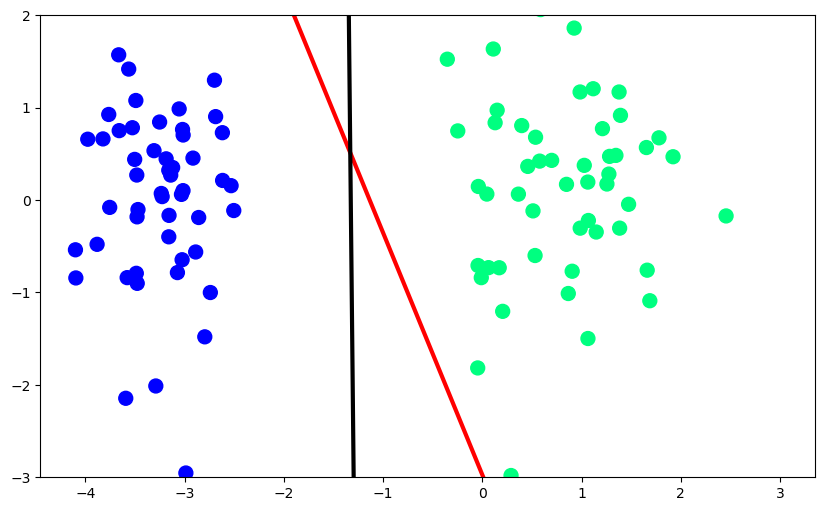

In [57]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)